# Capstone Project

## Collect Data For Analysis

### Scrape European Centre For Disease Control (ECDC) Covid 19 case data from ourworldindata.org

In [3]:
import pandas as pd

url = "https://covid.ourworldindata.org/data/ecdc/full_data.csv"
df_Covid = pd.read_csv(url)

print(df_Covid.head())

         date     location  new_cases  new_deaths  total_cases  total_deaths
0  2019-12-31  Afghanistan          0           0            0             0
1  2020-01-01  Afghanistan          0           0            0             0
2  2020-01-02  Afghanistan          0           0            0             0
3  2020-01-03  Afghanistan          0           0            0             0
4  2020-01-04  Afghanistan          0           0            0             0


### Remove unwanted columns to create a dataframe with Date, Location, and New Cases only. Dataframe called df_Covid_Sum (Covid summary).

In [4]:
df_Covid_Sum= df_Covid [['date','location','new_cases']]

print(df_Covid_Sum.head)

<bound method NDFrame.head of             date     location  new_cases
0     2019-12-31  Afghanistan          0
1     2020-01-01  Afghanistan          0
2     2020-01-02  Afghanistan          0
3     2020-01-03  Afghanistan          0
4     2020-01-04  Afghanistan          0
...          ...          ...        ...
8997  2020-04-01     Zimbabwe          1
8998  2020-04-02     Zimbabwe          0
8999  2020-04-03     Zimbabwe          0
9000  2020-04-04     Zimbabwe          1
9001  2020-04-05     Zimbabwe          0

[9002 rows x 3 columns]>


### Create csv from scraped data.

###### As the ECDC data is updated daily we have created a csv file of the data to 'freeze' the data as of the 3rd April 2020. 

In [5]:
df_Covid_Sum.to_csv (r'C:\Coursera\Covid_Sum.csv', index = False, header=True)

### Scrape global population data from the United Nations Department of Economic and Social Affairs at population.un.org

In [6]:
url = "https://population.un.org/wpp/Download/Files/1_Indicators%20(Standard)/CSV_FILES/WPP2019_TotalPopulationBySex.csv"
df_Pop = pd.read_csv(url)

print(df_Pop.head())

   LocID     Location  VarID Variant  Time  MidPeriod   PopMale  PopFemale  \
0      4  Afghanistan      2  Medium  1950     1950.5  4099.243   3652.874   
1      4  Afghanistan      2  Medium  1951     1951.5  4134.756   3705.395   
2      4  Afghanistan      2  Medium  1952     1952.5  4174.450   3761.546   
3      4  Afghanistan      2  Medium  1953     1953.5  4218.336   3821.348   
4      4  Afghanistan      2  Medium  1954     1954.5  4266.484   3884.832   

   PopTotal  PopDensity  
0  7752.117      11.874  
1  7840.151      12.009  
2  7935.996      12.156  
3  8039.684      12.315  
4  8151.316      12.486  


### Remove unwanted columns to create a dataframe with Location, Time, PopTotal, and PopDensity only. Dataframe called df_Pop_Sum (Population Summary)

In [7]:
df_Pop_Sum= df_Pop [['Location','Time','PopTotal','PopDensity']]

print(df_Pop_Sum.head())

      Location  Time  PopTotal  PopDensity
0  Afghanistan  1950  7752.117      11.874
1  Afghanistan  1951  7840.151      12.009
2  Afghanistan  1952  7935.996      12.156
3  Afghanistan  1953  8039.684      12.315
4  Afghanistan  1954  8151.316      12.486


### Create csv from scraped data.

In [8]:
df_Pop_Sum.to_csv (r'C:\Coursera\population_Sum.csv', index = False, header=True)

### Create dataframe of countries that have implemented Physical Distancing measures

In [10]:
df_Phys_Dist = pd.read_csv(r'C:\Coursera\Physical_Dist_Initiation.csv')

print(df_Phys_Dist.head())

       Country Date Initiated Compliance
0        China      23/1/2020       High
1        Italy      10/3/2020        Low
2        Spain      14/3/2020        Low
3       France      14/3/2020        Low
4  El Salvador      12/3/2020       High


# Methodolgy

### Install Components For Map Of Covid Case Data

In [11]:
!pip install beautifulsoup4
!pip install lxml
!pip install geopy
import requests
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt 
%matplotlib inline 

from sklearn.cluster import KMeans 
from sklearn.datasets.samples_generator import make_blobs
from sklearn.linear_model import LinearRegression

from geopy.geocoders import Nominatim
from IPython.display import Image 
from IPython.core.display import HTML 
from IPython.display import display_html

from pandas.io.json import json_normalize

!conda install -c conda-forge folium=0.5.0 --yes
import folium
from bs4 import BeautifulSoup
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
%matplotlib inline

Solving environment: ...working... done

# All requested packages already installed.



In [19]:
df_AllCov_Data = pd.read_csv(r'C:\Coursera\AllCov_Data.csv')
print(df_AllCov_Data.head())

   ID    location  Total Cases  PopTotal_2018  PopDensity_2018  PercentPop  \
0   4     Iceland         1220        336.712            3.359    0.003623   
1  13  Montserrat            5          4.993           49.930    0.001001   
2  17    Portugal         8251      10256.192          111.979    0.000804   
3  26     Bermuda           32         62.763         1255.260    0.000510   
4  27      Sweden         4947       9971.630           24.301    0.000496   

   Physical Dist Date Initiated Compliance  Days_Since_Lkdn  MinOfdate  \
0              1            NaN        NaN              NaN  29/2/2020   
1              1            NaN        NaN              NaN  21/3/2020   
2              1            NaN        NaN              NaN   3/3/2020   
3              1            NaN        NaN              NaN  20/3/2020   
4              1            NaN        NaN              NaN   1/2/2020   

   Days_Case_1_ToLkdn  Days_Since_Case_1  
0                 NaN                 33  


### Remove unwanted columns to create a dataframe with Location and Total Cases column only.

In [13]:
df_Countries_Pos= df_AllCov_Data[['location','Total Cases']]

print(df_Countries_Pos.head)

<bound method NDFrame.head of              location  Total Cases
0             Iceland         1220
1          Montserrat            5
2            Portugal         8251
3             Bermuda           32
4              Sweden         4947
..                ...          ...
169             Nepal            5
170             Sudan            7
171      Sierra Leone            1
172  Papua New Guinea            1
173       South Sudan            1

[174 rows x 2 columns]>


### Define geo json file and create base map

In [14]:
world_map = r'C:\Coursera\countries-10m.json'
wld_map = folium.Map(location=[30.5928, 114.3055], zoom_start=2, tiles='Mapbox Bright')
wld_map

### Generate choropleth map of total global Covid-19 cases.

In [17]:
wld_map.choropleth(
    geo_data=world_map,
    data=df_Countries_Pos,
    columns=['location', 'Total Cases'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Global Covid-19 Cases',
)

wld_map


### Remove unwanted columns to create a dataframe with Location and Physical Dist column only.

In [16]:
df_Countries_Phys_Dist= df_AllCov_Data[['location','Physical Dist']]

print(df_Countries_Phys_Dist.head)

<bound method NDFrame.head of              location  Physical Dist
0             Iceland              1
1          Montserrat              1
2            Portugal              1
3             Bermuda              1
4              Sweden              1
..                ...            ...
169             Nepal              0
170             Sudan              0
171      Sierra Leone              0
172  Papua New Guinea              0
173       South Sudan              0

[174 rows x 2 columns]>


### Generate chorpleth map of countries implementing physical distancing measures.

In [17]:
wld_map.choropleth(
    geo_data=world_map,
    data=df_Countries_Phys_Dist,
    columns=['location', 'Physical Dist'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Global Covid-19 Cases',
)

wld_map

### Analyse effect of population density on total cases.

In [20]:
lm = LinearRegression()
lm

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [22]:
X = df_AllCov_Data[['PopDensity_2018']]
Y = df_AllCov_Data['Total Cases']

In [23]:
lm.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [24]:
lm.intercept_

5058.860390115365

In [25]:
lm.coef_

array([-0.28078721])

(0, 232256.53735053437)

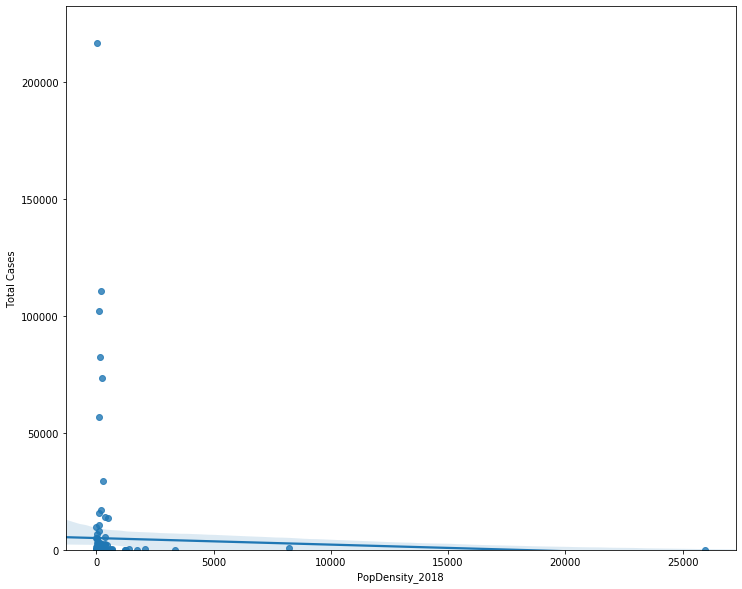

In [28]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="PopDensity_2018", y="Total Cases", data=df_AllCov_Data)
plt.ylim(0,)

### Analyse effect of population density on percentage of population infected

In [30]:
lm_2 = LinearRegression()
lm_2

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [32]:
X = df_AllCov_Data[['PopDensity_2018']]
Y = df_AllCov_Data['PercentPop']

In [33]:
lm_2.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [34]:
lm_2.intercept_

0.0002973517041579507

In [35]:
lm_2.coef_

array([4.9623983e-08])

(0, 0.01622628810266491)

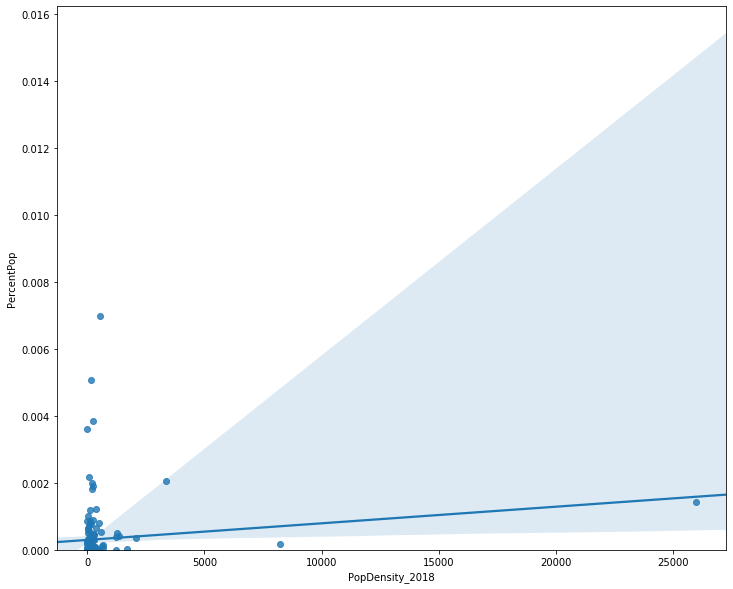

In [21]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="PopDensity_2018", y="PercentPop", data=df_AllCov_Data)
plt.ylim(0,)

### Analyse effect of Physical Distancing measures on total cases

In [37]:
lm_3 = LinearRegression()
lm_3

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [38]:
X = df_AllCov_Data[['Physical Dist']]
Y = df_AllCov_Data['Total Cases']

In [39]:
lm_3.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [40]:
lm_3.intercept_

-91.99485680888301

In [46]:
lm_3.coef_

array([4320.65569007])

(0, 227636.28305731673)

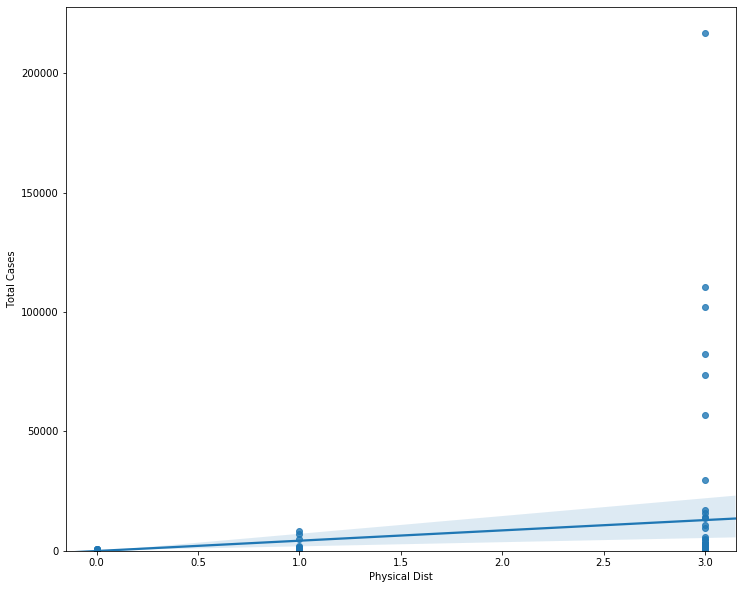

In [42]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Physical Dist", y="Total Cases", data=df_AllCov_Data)
plt.ylim(0,)

### Anaylse effect of Physical Distancing measures on percentage of population infected

In [43]:
lm_4 = LinearRegression()
lm_4

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [44]:
X = df_AllCov_Data[['Physical Dist']]
Y = df_AllCov_Data['PercentPop']

In [45]:
lm_4.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [47]:
lm_4.intercept_

6.224200330800703e-05

In [48]:
lm_4.coef_

array([0.0002182])

(0, 0.0073357065564348)

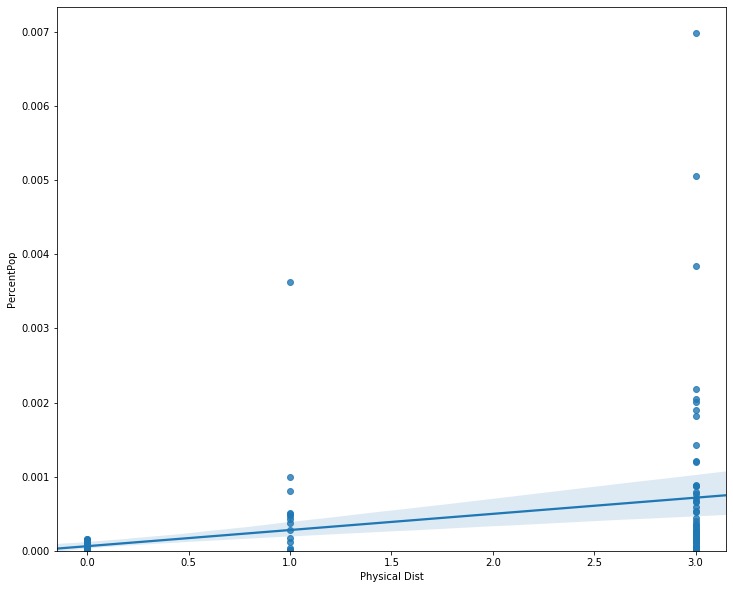

In [49]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Physical Dist", y="PercentPop", data=df_AllCov_Data)
plt.ylim(0,)

### Anaylse effect of time measures on percentage of population infected

In [50]:
lm_5 = LinearRegression()
lm_5

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [51]:
X = df_AllCov_Data[['Days_Since_Case_1']]
Y = df_AllCov_Data['PercentPop']

In [52]:
lm_5.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [53]:
lm_5.intercept_

0.0001243403266146885

In [54]:
lm_5.coef_

array([6.93649529e-06])

(0, 0.007336704249299831)

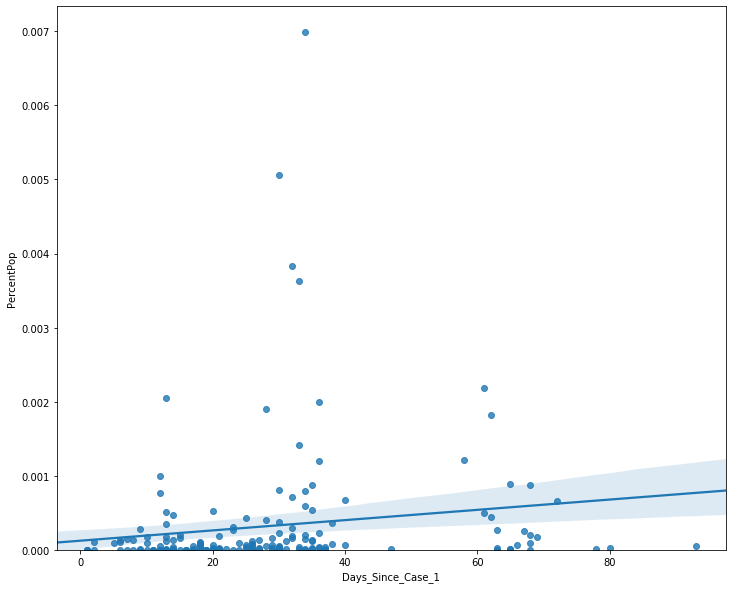

In [55]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(x="Days_Since_Case_1", y="PercentPop", data=df_AllCov_Data)
plt.ylim(0,)